<a href="https://colab.research.google.com/github/parmarkrish/deepul/blob/main/hw2_flow_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/rll/deepul/blob/master/homeworks/hw2/hw2_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Getting Started

## Overview
This semester, all homeworks will be conducted through Google Colab notebooks. All code for the homework assignment will be written and run in this notebook. Running in Colab will automatically provide a GPU, but you may also run this notebook locally by following [these instructions](https://research.google.com/colaboratory/local-runtimes.html) if you wish to use your own GPU.

You will save images in the notebooks to use and fill out a given LaTeX template which will be submitted to Gradescope, along with your notebook code.

## Using Colab
On the left-hand side, you can click the different icons to see a Table of Contents of the assignment, as well as local files accessible through the notebook.

Make sure to go to **Runtime -> Change runtime type** and select **GPU** as the hardware accelerator. This allows you to use a GPU. Run the cells below to get started on the assignment. Note that a session is open for a maximum of 12 hours, and using too much GPU compute may result in restricted access for a short period of time. Please start the homework early so you have ample time to work.

**If you loaded this notebook from clicking "Open in Colab" from github, you will need to save it to your own Google Drive to keep your work.**

## General Tips
In each homework problem, you will implement an flow model and run it on one to two datasets. We provide the expected outputs to help as a sanity check.

Feel free to print whatever output (e.g. debugging code, training code, etc) you want, as the graded submission will be the submitted pdf with images.

After you complete the assignment, download all of the image outputted in the results/ folder and upload them to the figure folder in the given latex template.

Run the cells below to download and load up the starter code.

In [1]:
!if [ -d deepul ]; then rm -Rf deepul; fi
!git clone https://github.com/rll/deepul.git
!pip install ./deepul

Cloning into 'deepul'...
remote: Enumerating objects: 758, done.
remote: Total 758 (delta 0), reused 0 (delta 0), pack-reused 758
Receiving objects: 100% (758/758), 118.40 MiB | 8.40 MiB/s, done.
Resolving deltas: 100% (347/347), done.
Updating files: 100% (129/129), done.
Processing ./deepul
  Preparing metadata (setup.py) ... done
  Created wheel for deepul: filename=deepul-0.1.0-py3-none-any.whl size=16621 sha256=c6a2813b61160140c85d11fbd1815aed45ee160d6868f51d4e39165da1611626
  Stored in directory: /tmp/pip-ephem-wheel-cache-0cr28bow/wheels/89/4d/b7/d666c1fdc2a51554c762f2cfe90dad1098871e7fea5c53eed4
Successfully built deepul


In [2]:
from deepul.hw2_helper import *

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from tqdm import tqdm

device = 'cuda' if torch.cuda.is_available() else 'cpu'
torch.set_default_device('cpu')

In [4]:
from torch.utils.data import TensorDataset

def dequantize_in_train(x, inv_scale):
    perturb = torch.rand(*x.shape) * inv_scale
    x = x + perturb
    return x

def create_dataloaders(train_data, test_data, batch_size):
    train_loader = DataLoader(train_data, batch_size, shuffle=True)
    test_loader = DataLoader(test_data, batch_size)
    return train_loader, test_loader

@torch.no_grad()
def test(model, test_loader, enable_grad=False):
    test_loss = 0
    for x in test_loader:
        x = x.to(device)
        with torch.autocast(device_type=device, dtype=torch.float16):
            test_loss += model.loss(x).item()
        # test_loss += model.loss(x).item()
    return test_loss / len(test_loader)

def train_one_epoch(model, optimizer, loader, loss_history, scale, scaler, clip=1.0, dequantize=False):
    for x in loader:
        if dequantize:
            x = dequantize_in_train(x, 1/scale)
        x = x.to(device)

        with torch.autocast(device_type=device, dtype=torch.float16):
            loss = model.loss(x)

        # loss = model.loss(x)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        nn.utils.clip_grad_norm_(model.parameters(), clip)
        scaler.step(optimizer)
        scaler.update()
        # loss.backward()
        # optimizer.step()
        optimizer.zero_grad()

        loss_history.append(loss.item())

def train(model, optimizer, train_loader, test_loader, lr_scheduler=None, num_epochs=10, clip=1.0, enable_grad_in_test=False, dequantize=False, is_q3=False):
    train_loss_history = []
    test_loss_history = []

    # hacky way to support different scales for dequantization
    scale = 4 if is_q3 else 2

    scaler = torch.cuda.amp.GradScaler()

    test_loss_history.append(test(model, test_loader, enable_grad=enable_grad_in_test))
    for epoch_num in range(1, num_epochs+1):
        train_one_epoch(model, optimizer, train_loader, train_loss_history, scale, scaler, clip=clip, dequantize=dequantize)
        test_loss = test(model, test_loader, enable_grad=enable_grad_in_test)
        test_loss_history.append(test_loss)
        if lr_scheduler is not None:
            lr_scheduler.step()
        print(f'epoch {epoch_num}:', test_loss + np.log(scale))

    return train_loss_history, test_loss_history

# Question 1: 2D Data

In this question, we will train two variants of flow models on continuous 2D data.

Execute the cell below to visualize our datasets

Dataset 1


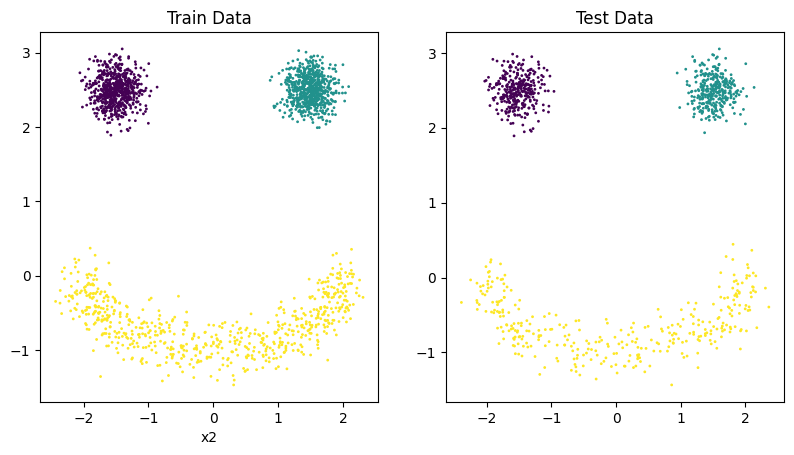

Dataset 2


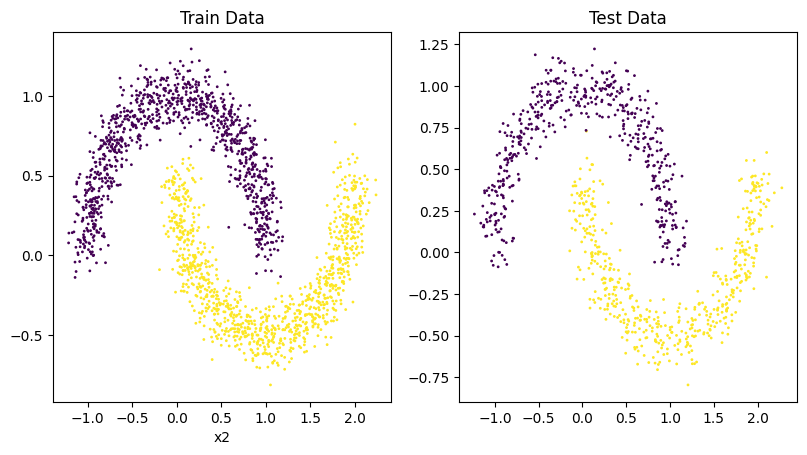

In [ ]:
visualize_q1_data(dset_type=1)
visualize_q1_data(dset_type=2)

## Part (a) Autoregressive Flow [15pt]

In an autoregressive flow, we learn the transformation $z_i = f(x_i ; x_{1:i-1})$. The log-likelihood is then $\log p_\theta(x) = \sum_{i=1}^d \log p(z_i) + \log |\frac{dz_i}{dx_i}|$ because the Jacobian is triangular. For each dimension, use the CDF of a mixture of Gaussians or Logistics to map to the latent space, which should be $z_i \sim \text{Unif}[0, 1]$ i.i.d..

Fit $p_\theta$ with maximum likelihood via stochastic gradient descent on the training set. Since this is a 2D problem, you can either learn $z_0 = f(x_0)$ and $z_1 = f(x_1; x_0)$ together with a MADE model, or with separate networks. Use your favorite version of stochastic gradient descent, and optimize your hyperparameters on a validation set of your choice.

**You will provide these deliverables**


1.   Over the course of training, record the average negative log-likelihood (nats / dim) of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves.
2.   Report the final test set performance of your final model
3. Show a heatmap of the densities learned by your model
4. Show what the training set looks like when mapped to the latent space.




In [ ]:
from torch.distributions.uniform import Uniform
from torch.autograd import grad

class MixtureOfLogistics2D(nn.Module):
    def __init__(self, n_logistics, h_dim):
        super().__init__()
        self.n_logistics = n_logistics

        self.weights1 = nn.Parameter(torch.rand(n_logistics))
        self.means1 = nn.Parameter(torch.rand(n_logistics))
        self.log_scales1 = nn.Parameter(torch.rand(n_logistics))

        self.mlp = nn.Sequential(*[nn.Linear(1, h_dim), nn.ReLU(), nn.Linear(h_dim, n_logistics * 3)])

    def forward(self, x):  # (N, 2)
        # seperate into column vectors
        x1 = x[:,0].unsqueeze(1)
        x2 = x[:,1].unsqueeze(1)

        z1s = torch.sigmoid((x1 - self.means1) / torch.exp(self.log_scales1))  # (N, n_logistics)

        params2 = self.mlp(x1)
        weights2, means2, log_scales2 = torch.chunk(params2, 3, dim=1)  # (N, n_logistics) * 3

        z2s = torch.sigmoid((x2 - means2) / torch.exp(log_scales2))  # (N, n_logistics)

        z1 = z1s @ F.softmax(self.weights1, dim=0)
        z2 = torch.sum(z2s * F.softmax(weights2, dim=1), dim=1)
        z = torch.stack((z1, z2), dim=1)
        return z

class AutoregressiveFlow2D(nn.Module):
    def __init__(self, n_logistics, h_dim, distribution=Uniform(torch.tensor(0.), torch.tensor(1.)), epsilon=1e-4):
        super().__init__()
        self.MoL = MixtureOfLogistics2D(n_logistics, h_dim)
        self.dist = distribution
        self.epsilon = epsilon

    def forward(self, x):
        x.requires_grad = True
        return self.MoL(x)

    def log_prob(self, x):
        z = self(x)

        # floating point arithmetic can make values slightly above/below 1/0
        # which is problematic since Uniform(0) can only accept values from (0, 1)
        if isinstance(distribution, Uniform):
            z[z >= self.dist.high] -= self.epsilon
            z[z <= self.dist.low] += self.epsilon

        z1, z2 = z[:, 0], z[:, 1]

        dx1 = grad(z1, x, grad_outputs=torch.ones_like(z1), create_graph=True)[0][:, 0]  # grad returns tuple of tensors
        dx2 = grad(z2, x, grad_outputs=torch.ones_like(z2), create_graph=True)[0][:, 1]

        log_probs1 = self.dist.log_prob(z1) + dx1.abs().log()
        log_probs2 = self.dist.log_prob(z2) + dx2.abs().log()

        return log_probs1 + log_probs2

    def loss(self, x):
        return -torch.mean(self.log_prob(x))

### Solution
Fill out the function below and return the necessary arguments. Feel free to create more cells if need be.

In [ ]:
def q1_a(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 2) numpy array of floats in R^2
    test_data: An (n_test, 2) numpy array of floats in R^2
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
                used to set different hyperparameters for different datasets, or
                for plotting a different region of densities

    Returns
    - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
    - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
    - a numpy array of size (?,) of probabilities with values in [0, +infinity).
        Refer to the commented hint.
    - a numpy array of size (n_train, 2) of floats in [0,1]^2. This represents
        mapping the train set data points through our flow to the latent space.
    """

    """ YOUR CODE HERE """
    # hyperparameters
    if dset_id == 1:
        lr, epochs, batch_size = 1e-2, 100, 256
    elif dset_id == 2:
        lr, epochs, batch_size = 1e-2, 100, 256

    # create data loaders
    train_loader, test_loader = create_dataloaders(train_data, test_data, batch_size)

    # model
    model = AutoregressiveFlow2D(n_logistics=4, h_dim=100)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # train
    train_losses, test_losses = train(model, optimizer, train_loader, test_loader, epochs, enable_grad_in_test=True)

    # heatmap
    dx, dy = 0.025, 0.025
    if dset_id == 1:  # face
        x_lim = (-4, 4)
        y_lim = (-4, 4)
    elif dset_id == 2:  # two moons
        x_lim = (-1.5, 2.5)
        y_lim = (-1, 1.5)
    y, x = np.mgrid[slice(y_lim[0], y_lim[1] + dy, dy),
                    slice(x_lim[0], x_lim[1] + dx, dx)]
    mesh_xs = (np.stack([x, y], axis=2).reshape(-1, 2))
    densities = np.exp(model.log_prob(torch.FloatTensor(mesh_xs)).detach().numpy())  # can't use torch.no_grad since we are using grad() in logprob

    # latents
    with torch.no_grad():
        latents = model.MoL(torch.FloatTensor(train_data))

    return train_losses, test_losses, densities, latents

### Results

Once you've implemented `q1_a`, execute the cells below to visualize and save your results



eval:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 1: 3.3687920570373535


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 2: 3.0766138434410095


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 3: 2.6648679971694946


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 4: 2.439415693283081


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 5: 2.4596447348594666


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 6: 2.3801888823509216


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 7: 2.3228208422660828


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 8: 2.3117198944091797


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 9: 2.271205723285675


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 10: 2.2652207016944885


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 11: 2.253271520137787


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 12: 2.2324137687683105


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 13: 2.223188817501068


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 14: 2.1594873666763306


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 15: 2.0921013355255127


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 16: 2.0179706513881683


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 17: 1.9142686426639557


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 18: 1.953940898180008


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 19: 1.7195135653018951


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 20: 1.6247558295726776


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 21: 1.567241758108139


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 22: 1.5033033788204193


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 23: 1.4761415123939514


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 24: 1.432096242904663


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 25: 1.4147716760635376


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 26: 1.42264062166214


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 27: 1.3914848566055298


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 28: 1.3887929916381836


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 29: 1.4026265740394592


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 30: 1.397981196641922


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 31: 1.414999097585678


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 32: 1.4327016770839691


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 33: 1.3668716549873352


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 34: 1.3623618185520172


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 35: 1.426051527261734


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 36: 1.4016265273094177


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 37: 1.3834985494613647


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 38: 1.41983100771904


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 39: 1.344289094209671


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 40: 1.3277528285980225


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 41: 1.3544025719165802


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 42: 1.3530765175819397


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 43: 1.3623760044574738


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 44: 1.3777989745140076


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 45: 1.3921630680561066


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 46: 1.3711884915828705


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 47: 1.3621274828910828


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 48: 1.3589886128902435


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 49: 1.3384435176849365


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 50: 1.365397959947586


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 51: 1.4766965806484222


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 52: 1.3484360575675964


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 53: 1.3379408121109009


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 54: 1.3448922336101532


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 55: 1.3621269762516022


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 56: 1.3873207569122314


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 57: 1.3449499607086182


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 58: 1.4027186632156372


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 59: 1.37849560379982


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 60: 1.4339991807937622


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 61: 1.4152941405773163


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 62: 1.369975060224533


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 63: 1.339065134525299


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 64: 1.3906299769878387


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 65: 1.4223324954509735


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 66: 1.3580598831176758


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 67: 1.3774999380111694


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 68: 1.3538865149021149


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 69: 1.372866839170456


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 70: 1.3496433794498444


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 71: 1.3562504351139069


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 72: 1.3665419816970825


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 73: 1.3213044703006744


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 74: 1.3524081110954285


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 75: 1.3486749827861786


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 76: 1.3623939752578735


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 77: 1.3565262258052826


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 78: 1.3484509587287903


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 79: 1.3694908916950226


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 80: 1.4008511304855347


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 81: 1.3577477931976318


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 82: 1.3372835516929626


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 83: 1.332122415304184


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 84: 1.3412141799926758


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 85: 1.3586540520191193


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 86: 1.3710722029209137


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 87: 1.3554286062717438


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 88: 1.3577390611171722


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 89: 1.3480576574802399


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 90: 1.3975461721420288


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 91: 1.3528509140014648


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 92: 1.3687987327575684


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 93: 1.353569120168686


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 94: 1.33609539270401


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 95: 1.333421677350998


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 96: 1.3757588267326355


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 97: 1.3504350185394287


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 98: 1.360623300075531


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 99: 1.3597470223903656


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 100: 1.3495190143585205
Final Test Loss: 1.3495


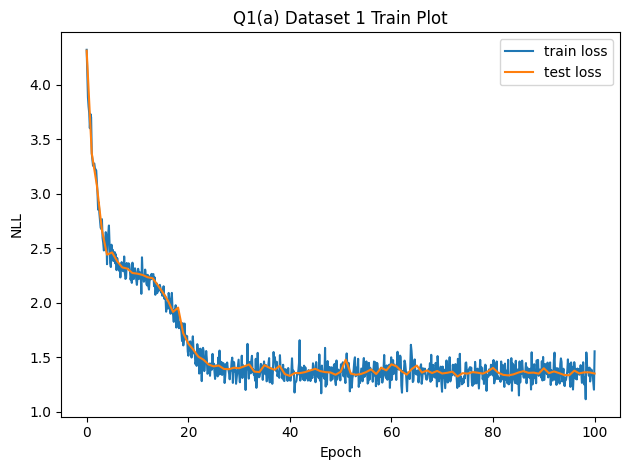

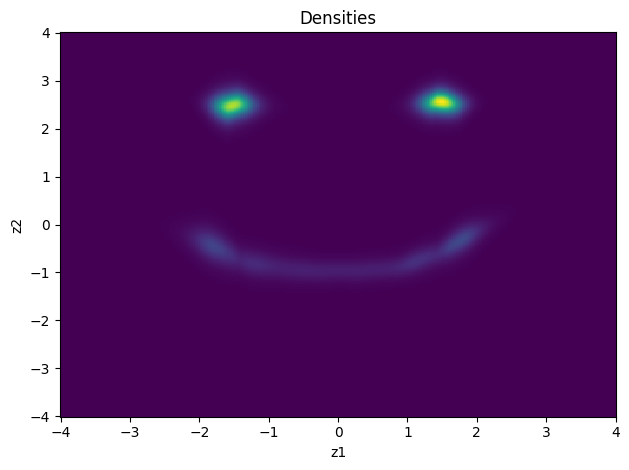

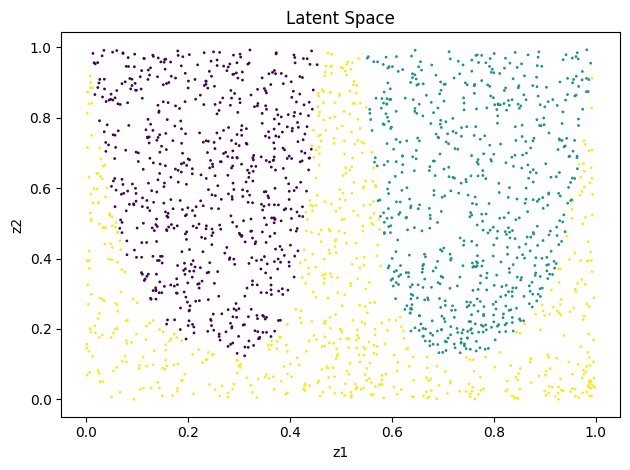

In [ ]:
q1_save_results(1, 'a', q1_a)

eval:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 1: 2.2872142791748047


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 2: 2.243864953517914


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 3: 1.8985062837600708


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 4: 1.7587515115737915


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 5: 1.6712288856506348


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 6: 1.6275726556777954


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 7: 1.5407673120498657


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 8: 1.4810446500778198


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 9: 1.4260774552822113


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 10: 1.3939585089683533


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 11: 1.3745059370994568


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 12: 1.3582358658313751


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 13: 1.3294724524021149


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 14: 1.3276698291301727


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 15: 1.3026218712329865


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 16: 1.3116939663887024


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 17: 1.3051844537258148


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 18: 1.2717250287532806


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 19: 1.286058396100998


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 20: 1.2770853638648987


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 21: 1.2922635078430176


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 22: 1.2798792719841003


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 23: 1.3019348680973053


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 24: 1.2700606882572174


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 25: 1.353259652853012


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 26: 1.302863597869873


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 27: 1.3316096663475037


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 28: 1.3166226148605347


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 29: 1.2815315425395966


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 30: 1.2574926614761353


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 31: 1.254255473613739


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 32: 1.2535108625888824


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 33: 1.2500423789024353


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 34: 1.2554419040679932


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 35: 1.2635519802570343


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 36: 1.259793609380722


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 37: 1.3556369543075562


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 38: 1.4506417214870453


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 39: 1.2956427335739136


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 40: 1.3456391990184784


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 41: 1.3305507600307465


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 42: 1.2893336117267609


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 43: 1.2807879149913788


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 44: 1.2876680493354797


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 45: 1.2480855286121368


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 46: 1.2385478615760803


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 47: 1.2727307975292206


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 48: 1.2660791873931885


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 49: 1.2803402245044708


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 50: 1.227326899766922


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 51: 1.3608181178569794


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 52: 1.2938022911548615


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 53: 1.2495364248752594


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 54: 1.2543801367282867


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 55: 1.3486676812171936


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 56: 1.2225175499916077


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 57: 1.2367718517780304


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 58: 1.2553702890872955


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 59: 1.3017742931842804


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 60: 1.2436679601669312


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 61: 1.2306621074676514


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 62: 1.2325884103775024


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 63: 1.2987424731254578


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 64: 1.2794139981269836


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 65: 1.307000756263733


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 66: 1.256506323814392


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 67: 1.3307698965072632


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 68: 1.204041987657547


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 69: 1.2208403944969177


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 70: 1.2092625200748444


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 71: 1.2679708302021027


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 72: 1.2171070277690887


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 73: 1.228390634059906


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 74: 1.216784417629242


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 75: 1.25232794880867


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 76: 1.2433940470218658


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 77: 1.2100135385990143


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 78: 1.2218339443206787


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 79: 1.2492052018642426


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 80: 1.222658634185791


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 81: 1.2155718505382538


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 82: 1.200466811656952


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 83: 1.2055916488170624


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 84: 1.2294338047504425


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 85: 1.1933440566062927


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 86: 1.2225340008735657


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 87: 1.2069345116615295


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 88: 1.195793330669403


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 89: 1.23848295211792


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 90: 1.245857447385788


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 91: 1.2721644639968872


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 92: 1.266607791185379


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 93: 1.2098252177238464


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 94: 1.1957812011241913


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 95: 1.205636590719223


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 96: 1.2806903421878815


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 97: 1.1983422935009003


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 98: 1.2141284942626953


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 99: 1.2554332613945007


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 100: 1.255480319261551
Final Test Loss: 1.2555


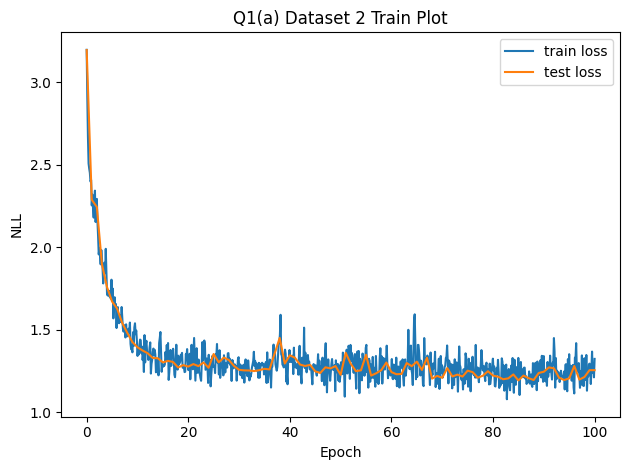

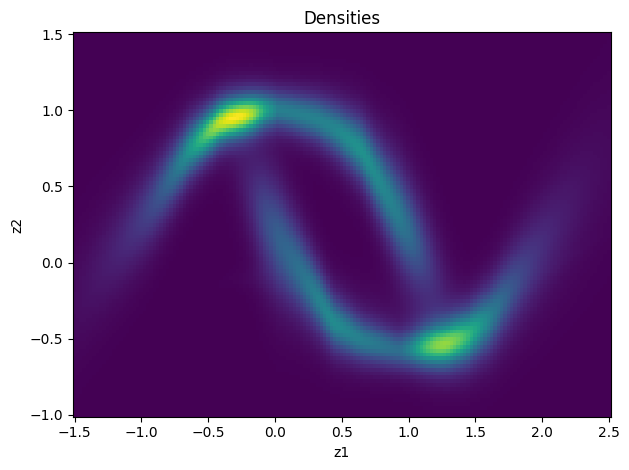

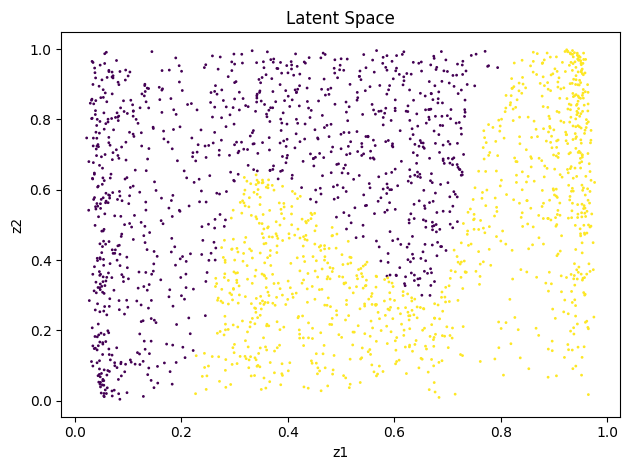

In [ ]:
q1_save_results(2, 'a', q1_a)

## Part (b) RealNVP [15pt]
In this part, we want to train a flow with the following structure:
$(z_1, z_2) = (f_{\theta, 1} \circ \cdots \circ f_{\theta, n})$,
where each $f_{\theta, i}$ is an affine transformation of 1 dimension, conditioned on the other, and $z \sim N(0, I)$. According to [Density Estimation Using Real NVP](https://arxiv.org/abs/1605.08803) Section 4.1, there's a particularly good way to parameterize the affine transformation:

Assuming that we're conditioning on $x_1$ and transforming $x_2$, we have

- $z_1 = x_1$

- $ \text{log_scale} = \text{scale} \times tanh(g_{\theta, \text{scale}}(x_1)) + \text{scale_shift}$

- $z_2 = exp(\text{log_scale}) \times x_2 + g_{\theta, \text{shift}}(x_1)$

where $g_\theta$, $\text{scale}$, and $\text{scale_shift}$ are all learned parameters.


**Train a RealNVP model and provide the same set of corresponding deliverables as part (a)**

### Solution
Fill out the function below and return the necessary arguments. Feel free to create more cells if need be.

In [ ]:
class AffineCoupling2D(nn.Module):
    def __init__(self, condition_on: str, h_dim: int):
        super().__init__()
        assert condition_on in ('x1', 'x2')
        self.condition_on = condition_on

        self.scale = nn.Parameter(torch.rand(1) * 0.1)
        self.scale_shift = nn.Parameter(torch.rand(1) * 0.1)

        self.scale_mlp = nn.Sequential(nn.Linear(1, h_dim), nn.ReLU(), nn.Linear(h_dim, 1))
        self.shift_mlp = nn.Sequential(nn.Linear(1, h_dim), nn.ReLU(), nn.Linear(h_dim, 1))

    def forward(self, x):  # (N, 2)
        x1 = x[:, 0].unsqueeze(1)
        x2 = x[:, 1].unsqueeze(1)

        x_cond, x_tran = (x1, x2) if self.condition_on == 'x1' else (x2, x1)

        z_cond = x_cond
        self.log_scale = self.scale * F.tanh(self.scale_mlp(x_cond)) + self.scale_shift
        z_tran = torch.exp(self.log_scale) * x_tran + self.shift_mlp(x_cond)

        z1, z2 = (z_cond, z_tran) if self.condition_on == 'x1' else (z_tran, z_cond)
        z = torch.concat((z1, z2), dim=1)
        return z


from torch.distributions.distribution import Distribution

class RealNVP2D(nn.Module):
    def __init__(self, n_layers: int, h_dim: int, distribution: Distribution):
        super().__init__()
        self.dist = distribution
        self.layers = []
        for i in range(n_layers):
            condition_on = 'x1' if i % 2 == 0 else 'x2'
            self.layers.append(AffineCoupling2D(condition_on, h_dim))
        self.net = nn.Sequential(*self.layers)

    def forward(self, x):
        return self.net(x)

    def log_prob(self, x):
        z = self.forward(x)

        log_det = sum(layer.log_scale for layer in self.layers)

        log_prob = self.dist.log_prob(z) + log_det.squeeze(1)
        return log_prob

    def loss(self, x):
        return -torch.mean(self.log_prob(x))

In [ ]:
from torch.distributions.multivariate_normal import MultivariateNormal
from torch.optim.lr_scheduler import StepLR

def q1_b(train_data, test_data, dset_id):
    """
    train_data: An (n_train, 2) numpy array of floats in R^2
    test_data: An (n_test, 2) numpy array of floats in R^2
    dset_id: An identifying number of which dataset is given (1 or 2). Most likely
                used to set different hyperparameters for different datasets, or
                for plotting a different region of densities

    Returns
    - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
    - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
    - a numpy array of size (?,) of probabilities with values in [0, +infinity).
        Refer to the commented hint.
    - a numpy array of size (n_train, 2) of floats in R^2. This represents
        mapping the train set data points through our flow to the latent space.
    """
    # hyperparameters
    if dset_id == 1:
        lr, epochs, batch_size = 1e-3, 250, 64
    elif dset_id == 2:
        lr, epochs, batch_size = 1e-3, 250, 64

    # create data loaders
    train_loader, test_loader = create_dataloaders(train_data, test_data, batch_size)

    # model
    distribution = MultivariateNormal(torch.zeros(2), torch.eye(2))
    model = RealNVP2D(n_layers=10, h_dim=100, distribution=distribution)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    lr_scheduler = StepLR(optimizer, step_size=150, gamma=0.3)

    # train
    train_losses, test_losses = train(model, optimizer, train_loader, test_loader, lr_scheduler=lr_scheduler, num_epochs=epochs)

    # heatmap
    dx, dy = 0.025, 0.025
    if dset_id == 1:  # face
        x_lim = (-4, 4)
        y_lim = (-4, 4)
    elif dset_id == 2:  # two moons
        x_lim = (-1.5, 2.5)
        y_lim = (-1, 1.5)
    y, x = np.mgrid[slice(y_lim[0], y_lim[1] + dy, dy),
                    slice(x_lim[0], x_lim[1] + dx, dx)]
    mesh_xs = (np.stack([x, y], axis=2).reshape(-1, 2))
    densities = np.exp(model.log_prob(torch.FloatTensor(mesh_xs)).detach().numpy())

    # latents
    with torch.no_grad():
        latents = model(torch.FloatTensor(train_data))

    return train_losses, test_losses, densities, latents
    """ YOUR CODE HERE """

### Results

Once you've implemented `q1_b`, execute the cells below to visualize and save your results



eval:   0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/250 [00:00<?, ?it/s]

train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 1: 3.4647623151540756


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 2: 3.10064198076725


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 3: 2.674037829041481


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 4: 2.4498773217201233


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 5: 2.283578857779503


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 6: 2.133194863796234


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 7: 2.095571354031563


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 8: 1.9595862179994583


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 9: 1.9151235967874527


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 10: 1.9285112842917442


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 11: 1.8977046459913254


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 12: 1.830600455403328


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 13: 1.8088590651750565


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 14: 1.7263118624687195


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 15: 1.7418610751628876


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 16: 1.6915652379393578


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 17: 1.6450956538319588


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 18: 1.6744756326079369


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 19: 1.6198887452483177


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 20: 1.7213784754276276


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 21: 1.6970449090003967


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 22: 1.7619410455226898


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 23: 1.7035478129982948


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 24: 1.558737389743328


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 25: 1.5346933752298355


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 26: 1.6173770874738693


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 27: 1.5923041924834251


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 28: 1.6218457743525505


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 29: 1.5395200550556183


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 30: 1.5124392285943031


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 31: 1.516690954566002


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 32: 1.5804037302732468


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 33: 1.5054729506373405


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 34: 1.471079796552658


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 35: 1.4999920725822449


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 36: 1.609917476773262


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 37: 1.478770300745964


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 38: 1.5979226380586624


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 39: 1.4475491642951965


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 40: 1.5230228900909424


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 41: 1.548734538257122


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 42: 1.6497261822223663


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 43: 1.4861460030078888


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 44: 1.5558782443404198


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 45: 1.5453975275158882


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 46: 1.4958937913179398


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 47: 1.4713486060500145


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 48: 1.6669527888298035


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 49: 1.5169543102383614


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 50: 1.5186437144875526


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 51: 1.4662498012185097


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 52: 1.4963581934571266


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 53: 1.4942202717065811


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 54: 1.4463036730885506


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 55: 1.5538485869765282


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 56: 1.4888948053121567


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 57: 1.5971299409866333


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 58: 1.4389106929302216


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 59: 1.4633175358176231


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 60: 1.4357782453298569


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 61: 1.4249406456947327


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 62: 1.4763554781675339


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 63: 1.4427216351032257


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 64: 1.5391026884317398


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 65: 1.4424715116620064


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 66: 1.4621929973363876


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 67: 1.5257707312703133


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 68: 1.5115998089313507


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 69: 1.4316044971346855


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 70: 1.4632011353969574


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 71: 1.5120772793889046


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 72: 1.4481699243187904


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 73: 1.4820034503936768


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 74: 1.4649312421679497


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 75: 1.4678602442145348


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 76: 1.4821885526180267


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 77: 1.5186926946043968


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 78: 1.531578041613102


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 79: 1.460168905556202


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 80: 1.4650002717971802


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 81: 1.4977709278464317


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 82: 1.5039570182561874


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 83: 1.4734760224819183


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 84: 1.4939924106001854


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 85: 1.4413196220993996


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 86: 1.5756243467330933


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 87: 1.5530416443943977


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 88: 1.4920545294880867


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 89: 1.463252641260624


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 90: 1.3979244008660316


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 91: 1.446134015917778


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 92: 1.4373989552259445


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 93: 1.4624579325318336


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 94: 1.470700480043888


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 95: 1.4192954450845718


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 96: 1.4417908415198326


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 97: 1.4564488306641579


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 98: 1.563651829957962


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 99: 1.4332002326846123


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 100: 1.434067741036415


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 101: 1.4823183342814445


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 102: 1.4314912930130959


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 103: 1.4020336791872978


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 104: 1.6025980934500694


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 105: 1.4035493582487106


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 106: 1.4273104891180992


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 107: 1.5303581357002258


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 108: 1.4287852868437767


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 109: 1.4979318603873253


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 110: 1.4734027311205864


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 111: 1.5757547169923782


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 112: 1.3949326947331429


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 113: 1.446811743080616


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 114: 1.445164568722248


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 115: 1.4048277586698532


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 116: 1.4507629945874214


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 117: 1.4680898860096931


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 118: 1.430474802851677


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 119: 1.4098459109663963


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 120: 1.4616314396262169


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 121: 1.4029549732804298


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 122: 1.5231800824403763


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 123: 1.4723464325070381


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 124: 1.410264402627945


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 125: 1.3919643387198448


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 126: 1.4625226855278015


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 127: 1.4489353373646736


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 128: 1.4291101098060608


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 129: 1.4573100805282593


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 130: 1.4690171629190445


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 131: 1.434104472398758


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 132: 1.4954015538096428


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 133: 1.436612755060196


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 134: 1.4586276933550835


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 135: 1.4316984191536903


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 136: 1.4560876786708832


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 137: 1.4076944887638092


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 138: 1.441458709537983


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 139: 1.461013987660408


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 140: 1.5246681347489357


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 141: 1.4259516671299934


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 142: 1.4740856140851974


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 143: 1.4026808887720108


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 144: 1.4475794658064842


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 145: 1.5275247916579247


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 146: 1.44827900826931


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 147: 1.4307196214795113


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 148: 1.4653509184718132


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 149: 1.5230695307254791


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 150: 1.4820352643728256


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 151: 1.4334907084703445


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 152: 1.3820815756917


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 153: 1.3773849084973335


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 154: 1.4021376818418503


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 155: 1.3693185448646545


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 156: 1.4052573963999748


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 157: 1.3968181610107422


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 158: 1.3741864189505577


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 159: 1.3971418142318726


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 160: 1.406112790107727


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 161: 1.3726145550608635


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 162: 1.376891277730465


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 163: 1.399728424847126


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 164: 1.3808634653687477


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 165: 1.3792199045419693


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 166: 1.4000724852085114


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 167: 1.3862365037202835


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 168: 1.3819734752178192


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 169: 1.3767807185649872


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 170: 1.369659960269928


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 171: 1.3832400366663933


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 172: 1.3792366981506348


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 173: 1.3785763680934906


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 174: 1.3767901584506035


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 175: 1.3864017575979233


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 176: 1.4001596122980118


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 177: 1.3928782567381859


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 178: 1.3784068897366524


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 179: 1.3737047836184502


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 180: 1.3762421756982803


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 181: 1.3779234886169434


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 182: 1.3936860859394073


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 183: 1.3875632137060165


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 184: 1.4052573665976524


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 185: 1.373929463326931


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 186: 1.3784392476081848


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 187: 1.3786732628941536


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 188: 1.3736605197191238


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 189: 1.3933259695768356


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 190: 1.3655105233192444


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 191: 1.4183561354875565


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 192: 1.4059532955288887


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 193: 1.3726168423891068


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 194: 1.4269656762480736


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 195: 1.3849866911768913


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 196: 1.3767413273453712


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 197: 1.3759075924754143


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 198: 1.3861456960439682


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 199: 1.3912075385451317


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 200: 1.3673838302493095


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 201: 1.3774745017290115


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 202: 1.416196070611477


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 203: 1.3679202124476433


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 204: 1.4122656658291817


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 205: 1.35892653465271


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 206: 1.3911022692918777


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 207: 1.400666207075119


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 208: 1.3975136131048203


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 209: 1.4094372168183327


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 210: 1.396286427974701


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 211: 1.4002627730369568


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 212: 1.3858072608709335


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 213: 1.3607468530535698


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 214: 1.390264593064785


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 215: 1.3919466733932495


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 216: 1.3774461522698402


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 217: 1.3871354833245277


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 218: 1.3782334476709366


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 219: 1.3846800699830055


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 220: 1.4004300981760025


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 221: 1.4044976606965065


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 222: 1.3882214650511742


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 223: 1.4288207441568375


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 224: 1.3834259659051895


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 225: 1.3773406222462654


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 226: 1.4019705206155777


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 227: 1.4363281726837158


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 228: 1.4014152213931084


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 229: 1.3961284905672073


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 230: 1.3644841089844704


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 231: 1.3733946532011032


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 232: 1.3724827617406845


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 233: 1.3776156455278397


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 234: 1.4027115926146507


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 235: 1.374515987932682


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 236: 1.3830115348100662


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 237: 1.3823398798704147


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 238: 1.3859720304608345


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 239: 1.4013180062174797


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 240: 1.3772680535912514


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 241: 1.3677644953131676


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 242: 1.3804021701216698


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 243: 1.4056779816746712


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 244: 1.3816913664340973


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 245: 1.3863698095083237


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 246: 1.3802724033594131


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 247: 1.3610780835151672


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 248: 1.4034006297588348


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 249: 1.3979516178369522


train:   0%|          | 0/32 [00:00<?, ?it/s]

eval:   0%|          | 0/16 [00:00<?, ?it/s]

epoch 250: 1.3900453820824623
Final Test Loss: 1.3900


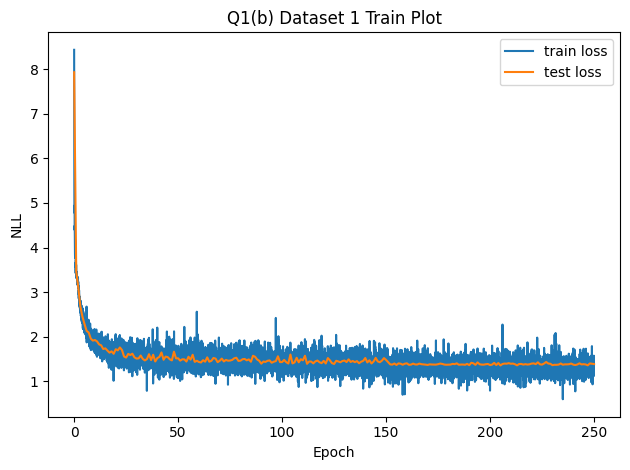

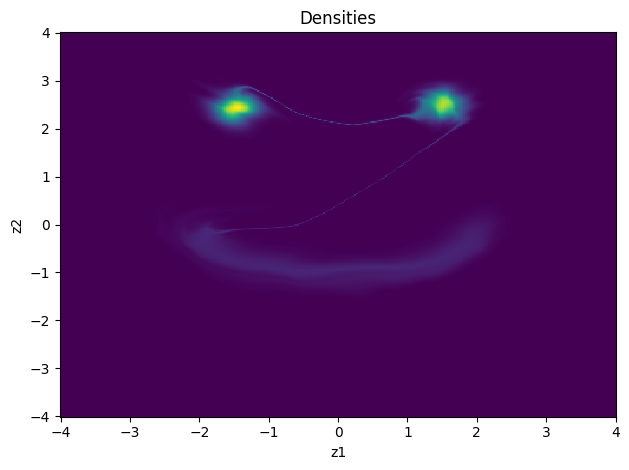

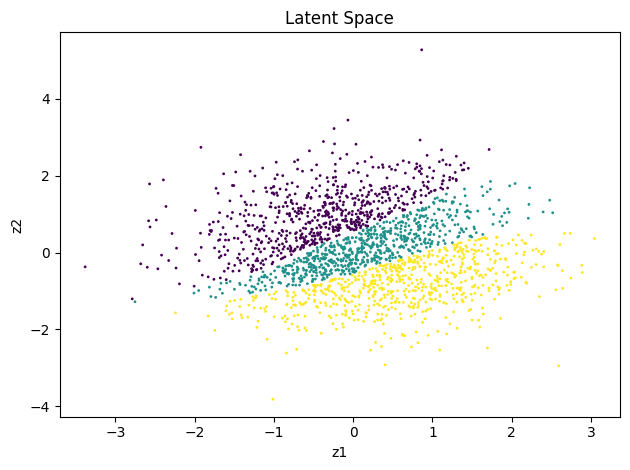

In [ ]:
q1_save_results(1, 'b', q1_b)

eval:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 1: 2.0335299372673035


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 2: 1.9238301515579224


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 3: 1.7520619928836823


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 4: 1.597148209810257


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 5: 1.6075985729694366


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 6: 1.4855278432369232


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 7: 1.5365517437458038


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 8: 1.4446902871131897


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 9: 1.5021971762180328


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 10: 1.4048676788806915


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 11: 1.4270729422569275


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 12: 1.568789780139923


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 13: 1.3142285645008087


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 14: 1.3268124461174011


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 15: 1.4509417414665222


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 16: 1.3404489159584045


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 17: 1.3618136942386627


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 18: 1.4974213242530823


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 19: 1.3183766901493073


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 20: 1.3361707627773285


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 21: 1.230467975139618


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 22: 1.576537847518921


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 23: 1.393818199634552


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 24: 1.2921120822429657


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 25: 1.1931682229042053


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 26: 1.3937413394451141


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 27: 1.2033140063285828


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 28: 1.3222938477993011


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 29: 1.295341968536377


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 30: 1.2195537090301514


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 31: 1.2115785479545593


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 32: 1.2001948654651642


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 33: 1.3032591342926025


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 34: 1.172677218914032


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 35: 1.1789941489696503


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 36: 1.1794776320457458


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 37: 1.2348582744598389


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 38: 1.1233684420585632


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 39: 1.4313956499099731


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 40: 1.211455523967743


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 41: 1.3731224238872528


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 42: 1.2089345455169678


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 43: 1.2541342079639435


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 44: 1.2522130906581879


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 45: 1.3466904163360596


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 46: 1.6275644600391388


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 47: 1.1821803748607635


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 48: 1.3739841282367706


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 49: 1.1649361550807953


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 50: 1.226206749677658


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 51: 1.2825998663902283


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 52: 1.2571074068546295


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 53: 1.1867230236530304


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 54: 1.1973878741264343


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 55: 1.1867856979370117


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 56: 1.1714051961898804


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 57: 1.2447227835655212


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 58: 1.254096895456314


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 59: 1.1809278428554535


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 60: 1.2012215554714203


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 61: 1.235675036907196


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 62: 1.2973088026046753


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 63: 1.2742850482463837


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 64: 1.2188849449157715


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 65: 1.1631140410900116


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 66: 1.1637758910655975


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 67: 1.2374187111854553


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 68: 1.29614919424057


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 69: 1.1682172119617462


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 70: 1.1103088855743408


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 71: 1.3339094519615173


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 72: 1.374268651008606


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 73: 1.2268007695674896


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 74: 1.198992371559143


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 75: 1.2133042514324188


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 76: 1.1789880394935608


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 77: 1.1914300620555878


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 78: 1.2310298383235931


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 79: 1.1415933072566986


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 80: 1.1597922146320343


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 81: 1.1564873456954956


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 82: 1.1967089474201202


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 83: 1.1371366083621979


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 84: 1.2081554532051086


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 85: 1.2031338512897491


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 86: 1.1333479583263397


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 87: 1.1333691477775574


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 88: 1.1372418999671936


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 89: 1.213380515575409


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 90: 1.1715105473995209


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 91: 1.1861953437328339


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 92: 1.1828222572803497


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 93: 1.1771100461483002


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 94: 1.2750726640224457


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 95: 1.1744551062583923


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 96: 1.159127116203308


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 97: 1.135993331670761


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 98: 1.2305812537670135


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 99: 1.1664547324180603


train:   0%|          | 0/8 [00:00<?, ?it/s]

eval:   0%|          | 0/4 [00:00<?, ?it/s]

epoch 100: 1.1587199568748474
Final Test Loss: 1.1587


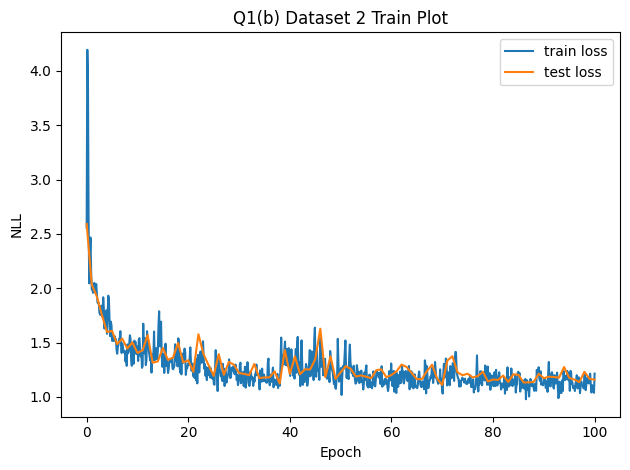

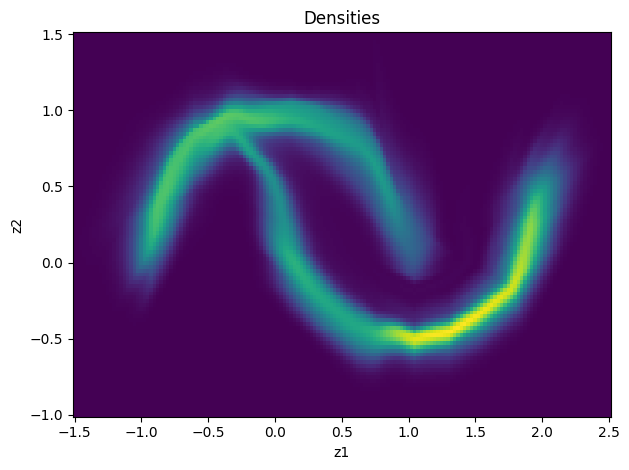

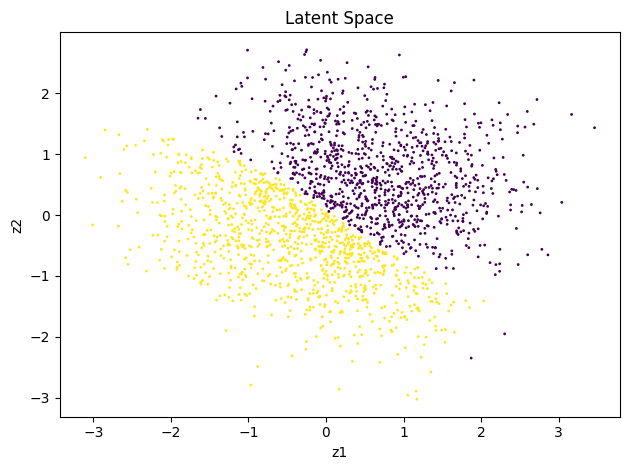

In [ ]:
q1_save_results(2, 'b', q1_b)

# Question 2: Autoregressive Flows for Images [20pt]
We can scale up the autoregressive flows from 1(a) to high-dimensional image data. In this question, we will focus on the black-and-white shapes dataset from Homework 1.

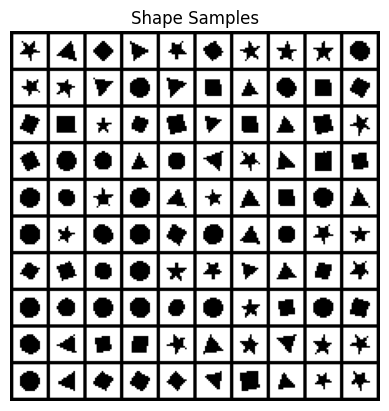

In [ ]:
visualize_q2_data()

Adapt your PixelCNN implementation from Homework 1 and use it as an autoregressive flow model on the black-and-white shapes dataset. Using the base architecture from Homework 1 3(a), output a mixture of logistics or gaussians (instead of logits), whose CDF we will use as our flow for each dimension of x.

Remember: you must dequantize the data and scale it between 0 and 1 for the autoregressive flow to have stable training.

**You will provide these deliverables**

1.   Over the course of training, record the average negative log-likelihood (nats / dim) of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves. **Make sure to account for any rescaling you do in your nats/dim.**
2.   Report the final test set performance of your final model
3. 100 samples from your autoregressive flow. Our plotting code will show your samples, with and without clipping and flooring (to remove the quantization).


### Solution
Fill out the function below and return the necessary arguments. Feel free to create more cells if need be.

In [ ]:
class MaskedConv2d(nn.Conv2d):
    def __init__(self, in_channels, out_channels, kernel_size, mask_type, padding=0):
        assert mask_type == 'A' or mask_type == 'B', "Mask type must be 'A' or 'B'"
        super().__init__(in_channels, out_channels, kernel_size, padding=padding)
        self.register_buffer('mask', torch.zeros(kernel_size, kernel_size))

        mid_index = kernel_size // 2
        self.mask[:mid_index] = 1
        self.mask[mid_index, :mid_index + (mask_type == 'B')] = 1  # go one more left if mask_type == 'B'
    def forward(self, x):
        self.weight.data *= self.mask
        return super().forward(x)

class PixelCNN(nn.Module):
    def __init__(self, num_channels, num_output_channels):
        super().__init__()
        layers = [MaskedConv2d(1, num_channels, 7, mask_type='A', padding='same'), nn.ReLU()]
        for _ in range(5):
            layers.extend([MaskedConv2d(num_channels, num_channels, 7, mask_type='B', padding='same'), nn.ReLU()])

        layers.extend([MaskedConv2d(num_channels, num_channels, 1, mask_type='B'), nn.ReLU()])
        layers.append(MaskedConv2d(num_channels, num_output_channels, 1, mask_type='B'))

        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)


class ARFlowPixelCNN(nn.Module):
    def __init__(self, n_channels, n_logistics):
        super().__init__()
        self.pixelcnn = PixelCNN(n_channels, 3*n_logistics)
        self.mol = MixtureOfLogistics()
    def loss(self, x):
        params = self.pixelcnn(x)
        loss = self.mol.loss(x, params)
        return loss

from torch.distributions.normal import Normal

class ARFlowPixelCNN2(nn.Module):
    def __init__(self, n_channels, n_gaussians, image_size=(20, 20)):
        super().__init__()
        self.n_gaussians = n_gaussians
        self.pixelcnn = PixelCNN(num_channels=n_channels, num_output_channels=3*n_gaussians)
        self.image_size = image_size

    def loss(self, x):  # x: (N, 1, H, W)
        params = self.pixelcnn(x)  # -> (N, 3*n_gaussians, H, W)

        weights_logits, means, log_scales = torch.chunk(params, 3, dim=1)  # (N, 3*n_gaussians, H, W) -> (N, n_gaussians, H, W)
        weights = F.softmax(weights_logits, dim=1)
        # log pdf == log det jacobian of cdf

        dx_mix = Normal(means, log_scales.exp()).log_prob(x)  # -> (N, n_gaussians, H, W)
        dx = (dx_mix * weights).sum(dim=1)  # -> (N, 1, H, W)

        loss = -dx.mean()
        return loss

    @torch.no_grad()
    def samples(self, N, device='cpu'):
        H, W = self.image_size
        x = torch.zeros(N, 1, H, W, device=device)

        for i in range(H*W):
            params = self.pixelcnn(x)

            i_params = params.view(N, 3*self.n_gaussians, H*W)[:, :, i]  # -> (N, 3*n_gaussians)
            i_weights_logits, i_means, i_log_scales = torch.chunk(i_params, 3, dim=1)  # (N, 3*n_gaussians) -> (N, n_gaussians)
            i_weights = F.softmax(i_weights_logits, dim=1)

            prior_samples = torch.multinomial(i_weights, 1) # -> (N, 1)

            # (N, n_gaussians) -> (N, 1)
            select_i_means = torch.gather(i_means, 1, prior_samples)
            select_log_scales = torch.gather(i_log_scales, 1, prior_samples)

            samples = Normal(select_i_means, select_log_scales.exp()).icdf(torch.rand(N, 1, device=device))  # -> (N)

            x.view(N, 1, H*W)[:, :, i] = samples  # insert samples back in
        return x

In [ ]:
def dequantize(data):
    perturb = np.random.uniform(high=0.5, size=data.shape).astype(np.float32)
    return data + perturb

In [ ]:
def q2(train_data, test_data):
    """
    train_data: A (n_train, H, W, 1) uint8 numpy array of binary images with values in {0, 1}
    test_data: A (n_test, H, W, 1) uint8 numpy array of binary images with values in {0, 1}
    H = W = 20
    Note that you should dequantize your train and test data, your dequantized pixels should all lie in [0,1]

    Returns
    - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
    - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
    - a numpy array of size (100, H, W, 1) of samples with values in [0, 1], where [0,0.5] represents a black pixel
        and [0.5,1] represents a white pixel. We will show your samples with and without noise.
    """
    # preprocess data
    train_data = train_data.transpose(0, 3, 1, 2).astype(np.float32) / 2
    test_data = test_data.transpose(0, 3, 1, 2).astype(np.float32) / 2

    test_data = dequantize(test_data)

    # set hyperparameters
    lr, epochs, batch_size, n_channels, n_gaussians = 0.001, 20, 64, 64, 10

    # create data loaders
    train_loader, test_loader = create_dataloaders(train_data, test_data, batch_size)

    # model
    model = ARFlowPixelCNN2(n_channels, n_gaussians).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # train
    train_losses, test_losses = train(model, optimizer, train_loader, test_loader, num_epochs=epochs, dequantize=True)

    samples = model.samples(100, device=device).cpu().numpy().transpose(0, 3, 2, 1)

    # np.log(2) to account for rescaling of the data
    return train_losses + np.log(2), test_losses + np.log(2), samples

### Results

Once you've implemented `q2`, execute the cells below to visualize and save your results



epoch 1: 0.5527157980633532
epoch 2: 0.4465975679404378
epoch 3: 0.6313653247351877
epoch 4: 0.34401440052181015
epoch 5: 0.34897971802295885
epoch 6: 0.3485454826549824
epoch 7: 0.31940344079381094
epoch 8: 0.3038889855828163
epoch 9: 0.29163326909106335
epoch 10: 0.28492311124332304
epoch 11: 0.2692164491022216
epoch 12: 0.2719185774017467
epoch 13: 0.2547089812043766
epoch 14: 0.24937441502759944
epoch 15: 0.24251935409089997
epoch 16: 0.23944343582946598
epoch 17: 0.23774326706537852
epoch 18: 0.2563539661414266
epoch 19: 0.23381319493576624
epoch 20: 0.23503943835447322
Final Test Loss: 0.2350


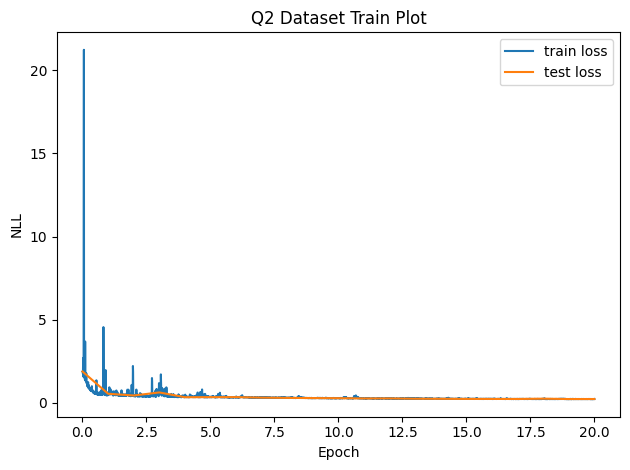

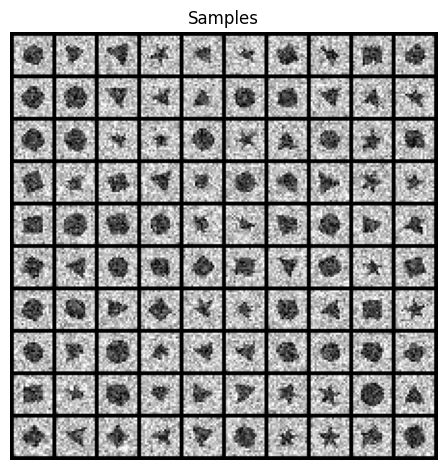

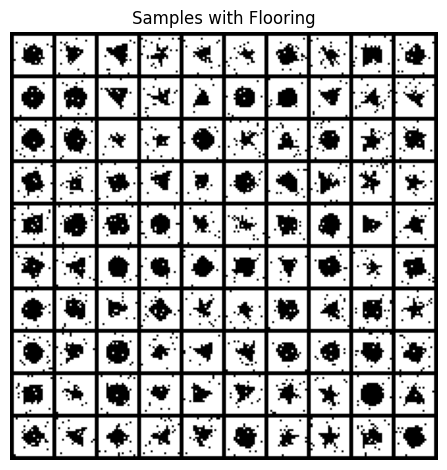

In [ ]:
q2_save_results(q2)  # training unstable likely due to lack of layer norm and skip connections in pixelcnn

# Question 3: RealNVP on Higher Dimensions


In this problem, you will train a flow model to invertibly map a high dimensional dataset of celebrity
faces to gaussian noise. The dataset is a low-resolution (32 × 32) version of the CelebA-HQ dataset that has been quantized to 2 bits per color channel.



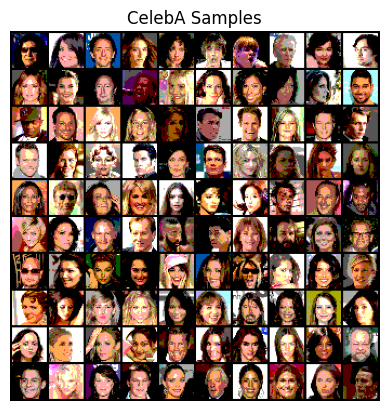

In [5]:
visualize_q3_data()

## Part (a): RealNVP [40pt]

Use the affine coupling flow from RealNVP and a form of [data-dependent initialization](https://arxiv.org/abs/1602.07868) that normalizes activations from an initial forward pass with a minibatch.
We describe a reference architecture below that can achieve good performance, but you are free
and encouraged to use different architectures and/or structure your code differently.



```
Preprocess() # dequantization, logit trick from RealNVP (Dinh et al) Section 4.1

for _ in range(4):
  AffineCouplingWithCheckerboard() # Figure 3 in Dinh et al - (left)
  ActNorm() # described in Glow (Kingma & Dhariwal) Section 3.1
Squeeze(), # [b, c, h, w] --> [b, c*4, h//2, w//2]

for _ in range(3):
  AffineCouplingWithChannel()
  ActNorm()
Unsqueeze(), # [b, c*4, h//2, w//2] --> [b, c, h, w]

for _ in range(3):
  AffineCouplingWithCheckerboard()
  ActNorm()
```



Here, we provide pseudocode for the basic structure of each coupling layer.



```
# pseudocode
ResnetBlock: n_filters
  h = x
  h = conv2d(n_filters, n_filters, (1,1), stride=1, padding=0)(h)
  h = relu(h)
  h = conv2d(n_filters, n_filters, (3,3), stride=1, padding=1)(h)
  h = relu(h)
  h = conv2d(n_filters, n_filters, (1,1), stride=1, padding=0)(h)
  return h + x

SimpleResnet: n_filters = 128, n_blocks = 8, n_out
  conv2d(in_channels, n_filters=n_filters, (3,3), stride=1, padding=1)
  apply 8 ResnetBlocks with n_filters=n_filters
  relu()
  conv2d(in_channels=n_filters, out_channels=n_out, (3,3), stride=1, padding=1)
  
AffineCoupling(x, mask):
  x_ = x * mask
  log_s, t = torch.chunk(SimpleResnet(x_), 2, dim=1)
  # calculate log_scale, as done in Q1(b)
  t = t * (1.0 - mask)
  log_scale = log_scale * (1.0 - mask)
  z = x * torch.exp(log_scale) + t
  log_det_jacobian = log_scale
  return z, log_det_jacobian
```



We use an Adam Optimizer with a warmup over 200 steps till a learning rate of 5e-4. We didn’t decay the learning rate but it is a generally recommended practice while training generative models. We show samples from our model at the end of training, as well as interpolations between several images in our dataset.  Our reference solution achieves a test loss of about 0.55 bits/dim after 100 epochs.



**You will provide these deliverables**


1.   Over the course of training, record the average negative log-likelihood (nats / dim) of the training data (per minibatch) and test data (for your entire test set). Code is provided that automatically plots the training curves.
2.   Report the final test set performance of your final model
3. 100 samples from the final trained model
4. 5 rows of interpolations between images in the test set; each row consists of the start and end images, and 4 intermediate ones. You should return 30 total images.



### Solution
Fill out the function below and return the necessary arguments. Feel free to create more cells if need be.

In [6]:
from torch.nn.utils.parametrizations import weight_norm

class ResnetBlock(nn.Module):
    def __init__(self, n_filters):
        super().__init__()
        self.conv1 = weight_norm(nn.Conv2d(n_filters, n_filters, 1))
        self.conv2 = weight_norm(nn.Conv2d(n_filters, n_filters, 3, padding=1))
        self.conv3 = weight_norm(nn.Conv2d(n_filters, n_filters, 1))
    def forward(self, x):
        h = self.conv1(x)
        h = F.relu(h)
        h = self.conv2(h)
        h = F.relu(h)
        h = self.conv3(h)
        h = F.relu(h)
        return h + x


class SimpleResnet(nn.Module):
    def __init__(self, in_channels, out_channels, n_filters=128, n_blocks=8):
        super().__init__()
        self.inital_conv = weight_norm(nn.Conv2d(in_channels, n_filters, 3, padding=1))
        self.resnet_blocks = nn.Sequential(*[ResnetBlock(n_filters) for _ in range(n_blocks)])
        self.out_conv = weight_norm(nn.Conv2d(n_filters, out_channels, 3, padding=1))
    def forward(self, x):
        x = self.inital_conv(x)
        x = self.resnet_blocks(x)
        x = F.relu(x)
        x = self.out_conv(x)
        return x


class AffineCoupling(nn.Module):
    def __init__(self, mask, in_channels, n_filters=128, n_blocks=8):
        super().__init__()
        self.register_buffer('mask', mask)
        self.scale = nn.Parameter(torch.rand(1) * 0.1)
        self.scale_shift = nn.Parameter(torch.rand(1) * 0.1)
        self.simple_resnest = SimpleResnet(in_channels, in_channels*2, n_filters=n_filters, n_blocks=n_blocks)

    def forward(self, x):
        x_ = x * self.mask
        out = self.simple_resnest(x_)  # (B, C, H, W) -> (B, 2C, H, W)
        log_s, t = torch.chunk(out, 2, dim=1)  # -> (B, C, H, W)
        log_scale = self.scale * F.tanh(log_s) + self.scale_shift

        t = t * (1 - self.mask)
        log_scale = log_scale * (1 - self.mask)

        self.log_det_jac_per_dim = log_scale.mean()  # save as attribute (per dim log abs det jacobian)
        # print(f'in affine coupling {self.log_det_jac_per_dim=}')

        return x * torch.exp(log_scale) + t

    @torch.no_grad()
    def reverse(self, y):
        y_ = y * self.mask
        out = self.simple_resnest(y_)  # (B, C, H, W) -> (B, 2C, H, W)
        log_s, t = torch.chunk(out, 2, dim=1)  # -> (B, C, H, W)
        log_scale = self.scale * F.tanh(log_s) + self.scale_shift

        t = t * (1 - self.mask)
        log_scale = log_scale * (1 - self.mask)

        return (y - t) * torch.exp(-log_scale)


def create_checkerboard_mask(H, W, alt=False):
    y_pattern, x_pattern = torch.meshgrid(torch.arange(W) + alt, torch.arange(H))
    return (y_pattern + x_pattern) % 2


class AffineCouplingWithCheckerboard(AffineCoupling):
    def __init__(self, feature_map_size, in_channels, n_filters=128, n_blocks=8, alt=False):
        super().__init__(
            create_checkerboard_mask(*feature_map_size, alt=alt),
            in_channels,
            n_filters=n_filters,
            n_blocks=n_blocks
        )


def create_channelwise_mask(n_channels, alt=False):
    x = torch.ones(n_channels, dtype=torch.bool)
    x[:n_channels//2] = 0
    if alt:
        x = ~x
    return x.view(1, n_channels, 1, 1).float()


class AffineCouplingWithChannel(AffineCoupling):
    def __init__(self, in_channels, n_filters=128, n_blocks=8, alt=False):
        super().__init__(
            create_channelwise_mask(in_channels, alt=alt),
            in_channels,
            n_filters=n_filters,
            n_blocks=n_blocks
        )


def squeeze(x):
    N, C, H, W = x.shape
    return F.unfold(x, 2, stride=2).view(N, C*4, H//2, W//2)


def unsqueeze(x):
    N, C, H, W = x.shape
    x = x.view(N, C, H*W)
    return F.fold(x, output_size=(H*2, W*2), kernel_size=2, stride=2)


class ActNorm(nn.Module):
    def __init__(self, n_channels):
        super().__init__()
        self.n_channels = n_channels
        self.scale = nn.Parameter(torch.empty(1, n_channels, 1, 1))
        self.bias = nn.Parameter(torch.empty(1, n_channels, 1, 1))
        self.is_initialized = False

    def forward(self, x):
        assert x.ndim == 4, "Only implemented for 4D tensor (N, C, H, W)"
        _, _, H, W = x.shape

        if not self.is_initialized:  # use first batch to initialize scale and bias
            self.bias.data = -x.detach().mean(dim=(0, 2, 3), keepdim=True)
            self.scale.data = 1. / (x.detach() + self.bias.data).std(dim=(0, 2, 3), keepdim=True)
            self.is_initialized = True

        self.log_det_jac_per_dim = self.scale.abs().log().mean()
        # print(f'in act norm{self.log_det_jac_per_dim=}')
        return self.scale * (x + self.bias)

    def reverse(self, y):
        return y / self.scale - self.bias

In [7]:
from torch.distributions import MultivariateNormal
from functools import partial

class RealNVP(nn.Module):
    def __init__(self, image_shape: tuple[int, int, int], n_filters):
        super().__init__()
        self.image_shape = image_shape
        n_channels = image_shape[0]
        self.n_dims = np.prod(image_shape)
        # not sure how to set automatically set device of distribution without passing it in
        self.distribution = MultivariateNormal(torch.zeros(self.n_dims, device='cuda'), torch.eye(self.n_dims, device='cuda'))
        # self.distribution = MultivariateNormal(torch.zeros(self.n_dims), torch.eye(self.n_dims))

        self.stage1 = self._create_stage('checkerboard', 4, in_channels=n_channels, n_filters=n_filters)
        self.stage2 = self._create_stage('channel', 3, in_channels=n_channels*4, n_filters=n_filters)
        self.stage3 = self._create_stage('checkerboard', 3, in_channels=n_channels, n_filters=n_filters)

    def _create_stage(self, type, n_reps, in_channels, n_filters=128, n_blocks=8):
        assert type in ('checkerboard', 'channel'), "Invalid type. Choose from either 'checkerboard' or 'channel'"
        AffineCouplingType = partial(AffineCouplingWithCheckerboard, self.image_shape[1:]) if type == 'checkerboard' else AffineCouplingWithChannel
        layers = nn.ModuleList()
        # for i in range(n_reps):
            # layers.append(AffineCouplingType(in_channels, n_filters=n_filters, n_blocks=n_blocks, alt=(i % 2)))
        for i in range(n_reps):
            layers.extend([
                AffineCouplingType(in_channels, n_filters=n_filters, n_blocks=n_blocks, alt=(i % 2)),
                ActNorm(in_channels)
            ])
        return layers

    def forward(self, x):
        for layer in self.stage1:
            x = layer(x)
        x = squeeze(x)
        for layer in self.stage2:
            x = layer(x)
        x = unsqueeze(x)
        for layer in self.stage3:
            x = layer(x)
        return x

    def loss(self, x):
        out = self.forward(x)
        # modules() method recursively gets all modules (i.e sub-modules as well), so we have to filter using isinstance
        log_det_jac_per_dim = sum([m.log_det_jac_per_dim for m in self.modules() if isinstance(m, (AffineCoupling, ActNorm))])
        log_prob_z_per_dim = self.distribution.log_prob(out.flatten(start_dim=1)).mean() / self.n_dims
        loss = -(log_prob_z_per_dim + log_det_jac_per_dim)
        return loss

    @torch.no_grad()
    def reverse(self, y):  # used for testing, could be folded into samples
        for layer in reversed(self.stage3):
            y = layer.reverse(y)
        y = squeeze(y)
        for layer in reversed(self.stage2):
            y = layer.reverse(y)
        y = unsqueeze(y)
        for layer in reversed(self.stage1):
            y = layer.reverse(y)
        return y

    @torch.no_grad()
    def samples(self, n_samples, device='cuda'):
        y = torch.randn(n_samples, *self.image_shape, device=device)
        return self.reverse(y)

In [8]:
def dequantize_q3(data):
    perturb = np.random.uniform(high=0.25, size=data.shape).astype(np.float32)
    return data + perturb

In [9]:
@torch.no_grad()
def create_interpolations(model, test_data, n_samples=5, n_interp_states=6, device='cuda'):
    imgs = [torch.tensor(test_data[i], device=device) for i in range(2*n_samples)]
    latents = model(torch.stack(imgs, dim=0))
    alphas = torch.linspace(0, 1, n_interp_states)
    return model.reverse(
        torch.stack([
            start_latent*(1-alpha) + end_latent*alpha
            for start_latent, end_latent in zip(latents, latents[1:])
            for alpha in alphas
        ], dim=0)
    )

In [ ]:
def q3_a(train_data, test_data):
    """
    train_data: A (n_train, H, W, 3) uint8 numpy array of quantized images with values in {0, 1, 2, 3}
    test_data: A (n_test, H, W, 3) uint8 numpy array of binary images with values in {0, 1, 2, 3}

    Returns
    - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
    - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
    - a numpy array of size (100, H, W, 3) of samples with values in [0, 1]
    - a numpy array of size (30, H, W, 3) of interpolations with values in [0, 1].
    """
    # preprocess data
    train_data = train_data.transpose(0, 3, 1, 2).astype(np.float32) / 4
    test_data = test_data.transpose(0, 3, 1, 2).astype(np.float32) / 4
    image_shape = train_data.shape[1:]

    # import matplotlib.pyplot as plt
    # print(test_data[0].shape)
    # plt.imshow(test_data[0].transpose(1, 2, 0))

    test_data_dequant = dequantize_q3(test_data)

    # set hyperparameters
    lr, epochs, batch_size, n_filters = 5e-4, 100, 128, 128

    # create data loaders
    train_loader, test_loader = create_dataloaders(train_data, test_data_dequant, batch_size)

    # model
    model = RealNVP(image_shape, n_filters).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # train
    train_losses, test_losses = train(model, optimizer, train_loader, test_loader, num_epochs=epochs, dequantize=True, is_q3=True)

    samples = model.samples(100, device=device).cpu().numpy().transpose(0, 2, 3, 1)
    interpolations = create_interpolations(model, test_data).cpu().numpy().transpose(0, 2, 3, 1)

    # rescale loss (adding np.log(4) is equivalent to dividing p(x) by 4. We do this since we scaled down the data by 4.
    return train_losses + np.log(4), test_losses + np.log(4), samples, interpolations

    """ YOUR CODE HERE """

In [ ]:
import gc
gc.collect()

33689

### Results

Once you've implemented `q3_a`, execute the cells below to visualize and save your results



epoch 1: 0.7135201036365848
epoch 2: 0.6749838751211011
epoch 3: 0.6494001796387764
epoch 4: 0.6371646860671064
epoch 5: 0.616306159837248
epoch 6: 0.6070343019221468
epoch 7: 0.6008613689617779
epoch 8: 0.5852536565163422
epoch 9: 0.5799727997833732
epoch 10: 0.5762521431941477
epoch 11: 0.5693507266804928
epoch 12: 0.5614641270691398
epoch 13: 0.5557591038157343
epoch 14: 0.5538031464913178
epoch 15: 0.5447174846561771
epoch 16: 0.5436235164590256
epoch 17: 0.5428859354708834
epoch 18: 0.5335671157184375
epoch 19: 0.5324956361330019
epoch 20: 0.5282457410724979
epoch 21: 0.5269777096519668
epoch 22: 0.5255811639945617
epoch 23: 0.5177337025590317
epoch 24: 0.5204862958290863
epoch 25: 0.5131907822344942
epoch 26: 0.5117233534089746
epoch 27: 0.5072691954384048
epoch 28: 0.5085692720820307
epoch 29: 0.5065239298662454
epoch 30: 0.49893437772865856
epoch 31: 0.5017068303833205
epoch 32: 0.4976970140016542
epoch 33: 0.5075349946252526
epoch 34: 0.4964260045564638
epoch 35: 0.51252512197

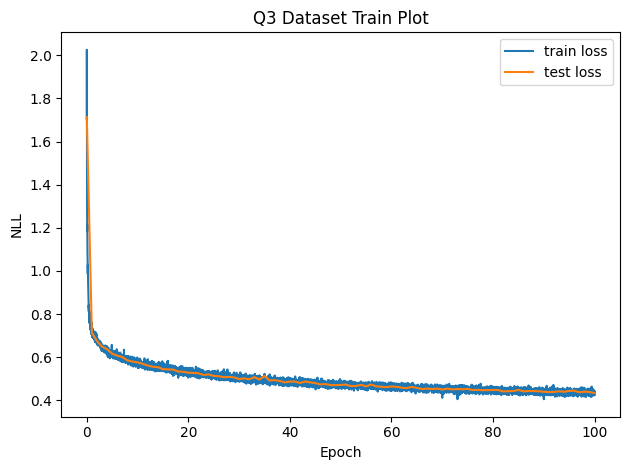

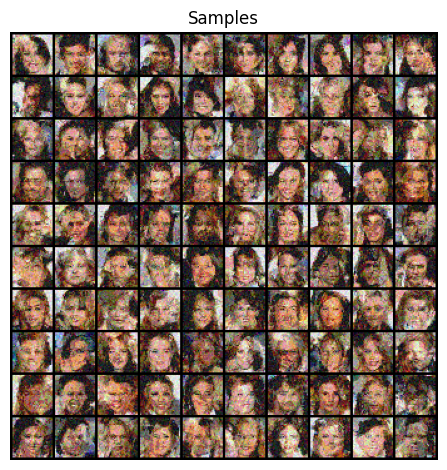

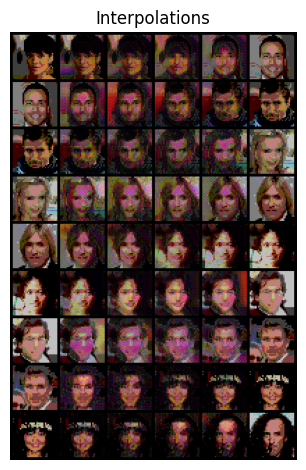

In [ ]:
q3_save_results(q3_a, 'a')

## Part (b): Exploring bad masking schemes [10pt]

As shown in lecture, the choice of masking or partitioning scheme affects the quality of the final flow model. In this part, design a *bad* masking scheme and train a model with it on the same CelebA dataset.

**Provide the same deliverables as part (a)**

In [10]:
def create_half_mask(H, W, alt=False):
    x = torch.ones(H, W, dtype=torch.bool)
    x[:, :W//2] = 0
    if alt:
        x = ~x
    return x.float()


class AffineCouplingHalf(AffineCoupling):
    def __init__(self, feature_map_size, in_channels, n_filters=128, n_blocks=8, alt=False):
        super().__init__(
            create_half_mask(*feature_map_size, alt=alt),
            in_channels,
            n_filters=n_filters,
            n_blocks=n_blocks
        )

In [11]:
from torch.distributions import MultivariateNormal
from functools import partial

class RealNVP(nn.Module):
    def __init__(self, image_shape: tuple[int, int, int], n_filters):
        super().__init__()
        self.image_shape = image_shape
        n_channels = image_shape[0]
        self.n_dims = np.prod(image_shape)
        # not sure how to set automatically set device of distribution without passing it in
        self.distribution = MultivariateNormal(torch.zeros(self.n_dims, device='cuda'), torch.eye(self.n_dims, device='cuda'))
        # self.distribution = MultivariateNormal(torch.zeros(self.n_dims), torch.eye(self.n_dims))

        self.stage1 = self._create_stage('half', 4, in_channels=n_channels, n_filters=n_filters)
        self.stage2 = self._create_stage('channel', 3, in_channels=n_channels*4, n_filters=n_filters)
        self.stage3 = self._create_stage('half', 3, in_channels=n_channels, n_filters=n_filters)

    def _create_stage(self, type, n_reps, in_channels, n_filters=128, n_blocks=8):
        assert type in ('half', 'channel'), "Invalid type. Choose from either 'checkerboard' or 'channel'"
        AffineCouplingType = partial(AffineCouplingHalf, self.image_shape[1:]) if type == 'half' else AffineCouplingWithChannel
        layers = nn.ModuleList()

        for i in range(n_reps):
            layers.extend([
                AffineCouplingType(in_channels, n_filters=n_filters, n_blocks=n_blocks, alt=(i % 2)),
                ActNorm(in_channels)
            ])
        return layers

    def forward(self, x):
        for layer in self.stage1:
            x = layer(x)
        x = squeeze(x)
        for layer in self.stage2:
            x = layer(x)
        x = unsqueeze(x)
        for layer in self.stage3:
            x = layer(x)
        return x

    def loss(self, x):
        out = self.forward(x)
        # modules() method recursively gets all modules (i.e sub-modules as well), so we have to filter using isinstance
        log_det_jac_per_dim = sum([m.log_det_jac_per_dim for m in self.modules() if isinstance(m, (AffineCoupling, ActNorm))])
        log_prob_z_per_dim = self.distribution.log_prob(out.flatten(start_dim=1)).mean() / self.n_dims
        loss = -(log_prob_z_per_dim + log_det_jac_per_dim)
        return loss

    @torch.no_grad()
    def reverse(self, y):  # used for testing, could be folded into samples
        for layer in reversed(self.stage3):
            y = layer.reverse(y)
        y = squeeze(y)
        for layer in reversed(self.stage2):
            y = layer.reverse(y)
        y = unsqueeze(y)
        for layer in reversed(self.stage1):
            y = layer.reverse(y)
        return y

    @torch.no_grad()
    def samples(self, n_samples, device='cuda'):
        y = torch.randn(n_samples, *self.image_shape, device=device)
        return self.reverse(y)

In [18]:
def q3_b(train_data, test_data):
    """
    train_data: A (n_train, H, W, 3) uint8 numpy array of quantized images with values in {0, 1, 2, 3}
    test_data: A (n_test, H, W, 3) uint8 numpy array of binary images with values in {0, 1, 2, 3}

    Returns
    - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
    - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
    - a numpy array of size (100, H, W, 3) of samples with values in [0, 1]
    - a numpy array of size (30, H, W, 3) of interpolations with values in [0, 1].
    """
    # preprocess data
    train_data = train_data.transpose(0, 3, 1, 2).astype(np.float32) / 4
    test_data = test_data.transpose(0, 3, 1, 2).astype(np.float32) / 4
    image_shape = train_data.shape[1:]

    test_data_dequant = dequantize_q3(test_data)

    # set hyperparameters
    lr, epochs, batch_size, n_filters = 5e-4, 100, 128, 128

    # create data loaders
    train_loader, test_loader = create_dataloaders(train_data, test_data_dequant, batch_size)

    # model
    model = RealNVP(image_shape, n_filters).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # train
    train_losses, test_losses = train(model, optimizer, train_loader, test_loader, num_epochs=epochs, dequantize=True, is_q3=True)

    samples = model.samples(100, device=device).cpu().numpy().transpose(0, 2, 3, 1)
    interpolations = create_interpolations(model, test_data).cpu().numpy().transpose(0, 2, 3, 1)

    # rescale loss (adding np.log(4) is equivalent to dividing p(x) by 4. We do this since we scaled down the data by 4.
    return train_losses + np.log(4), test_losses + np.log(4), samples, interpolations

    """ YOUR CODE HERE """

epoch 1: 0.7847695555387624
epoch 2: 0.728616845330576
epoch 3: 0.7065014668624511
epoch 4: 0.6718782060111915
epoch 5: 0.668892684412093
epoch 6: 0.6575986550349681
epoch 7: 0.6508519280275613
epoch 8: 0.6426111289184203
epoch 9: 0.6294567745580518
epoch 10: 0.6392589747341495
epoch 11: 0.6279796036844805
epoch 12: 0.6397786698395256
epoch 13: 0.6320087098952597
epoch 14: 0.6220116069459053
epoch 15: 0.6101810342171479
epoch 16: 0.6062805923586443
epoch 17: 0.6028975055713145
epoch 18: 0.6031619029452204
epoch 19: 0.6012192661551214
epoch 20: 0.5948476245545479
epoch 21: 0.5903791857526058
epoch 22: 0.594725534373833
epoch 23: 0.5885940619628539
epoch 24: 0.5933709901227796
epoch 25: 0.5856180462008074
epoch 26: 0.5854735512963952
epoch 27: 0.5871484307766865
epoch 28: 0.5775004587227348
epoch 29: 0.5797124930541625
epoch 30: 0.5784925493364885
epoch 31: 0.574785427416786
epoch 32: 0.5703795138872133
epoch 33: 0.5762955442058619
epoch 34: 0.5698474452990977
epoch 35: 0.568407445648071

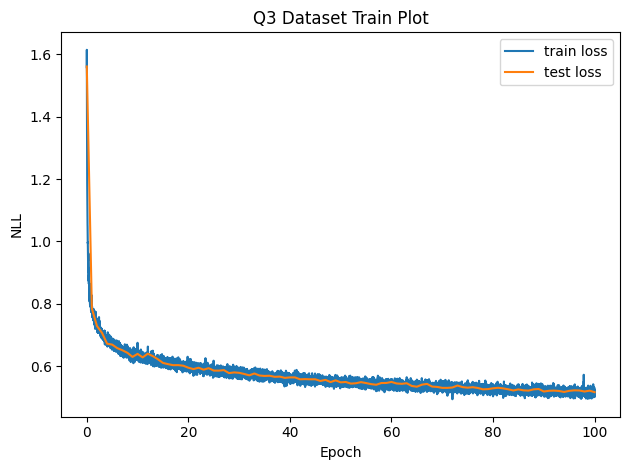

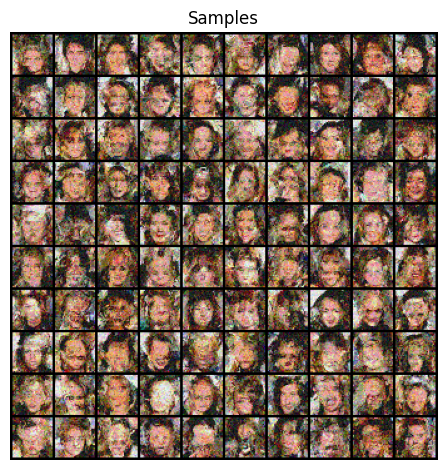

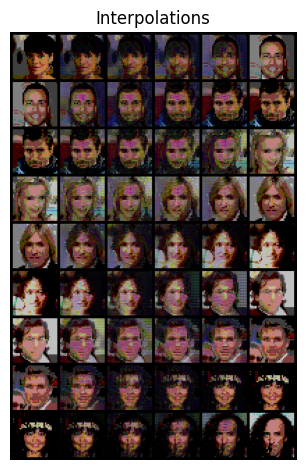

In [19]:
q3_save_results(q3_b, 'b')

# Question 4: Bonus Questions (Optional)

## Q4(a): Multiscale RealNVP [10pt]
Following the alternating checkerboard, channel squeeze, and channel partition scheme used in https://arxiv.org/abs/1605.08803, learn a multiscale RealNVP model on our CelebA dataset used in Question 3. We expect the same deliverables as in Question 3; additionally, make sure to include analysis on any difference in qualitative or quantitative differences you see in the results.

In [ ]:
def q4_a(train_data, test_data):
  """
  train_data: A (n_train, H, W, 3) uint8 numpy array of quantized images with values in {0, 1, 2, 3}
  test_data: A (n_test, H, W, 3) uint8 numpy array of binary images with values in {0, 1, 2, 3}

  Returns
  - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
  - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
  - a numpy array of size (100, H, W, 3) of samples with values in [0, 1]
  - a numpy array of size (30, H, W, 3) of interpolations with values in [0, 1].
  """

  """ YOUR CODE HERE """

In [ ]:
q3_save_results(q4_a, 'bonus_a')

## Q4(b): Glow [5pt]
The Glow paper introduces the invertible 1x1 convolution as a replacement for the permutation scheme that follows the channel squeezing step. Use this in your model from Question 3, and report the same deliverables. Make sure to include analysis on any difference in qualitative or quantitative differences you see in the results.

In [ ]:
def q4_b(train_data, test_data):
  """
  train_data: A (n_train, H, W, 3) uint8 numpy array of quantized images with values in {0, 1, 2, 3}
  test_data: A (n_test, H, W, 3) uint8 numpy array of binary images with values in {0, 1, 2, 3}

  Returns
  - a (# of training iterations,) numpy array of train_losses evaluated every minibatch
  - a (# of epochs + 1,) numpy array of test_losses evaluated once at initialization and after each epoch
  - a numpy array of size (100, H, W, 3) of samples with values in [0, 1]
  - a numpy array of size (30, H, W, 3) of interpolations with values in [0, 1].
  """

  """ YOUR CODE HERE """

In [ ]:
q3_save_results(q4_b, 'bonus_b')

# File Saving Utility


In [ ]:
# one way to save files
from google.colab import files
import os
import os.path as osp
for fname in os.listdir('results'):
    files.download('results/' + fname)